### Import packages and code

We build the simulation model with TuLiPa and use some functionality from [JulES](https://github.com/NVE/JulES)

In [59]:
# using Pkg; Pkg.update("TuLiPa") # uncomment to update TuLiPa to latest version
# using Pkg; Pkg.update("JulES") # uncomment to update JulES to latest version
using DataFrames, Plots, Statistics, JSON, Distributed, Distributions, TuLiPa, CSV, Dates, HiGHS, JuMP, Clustering, JulES
#plotlyjs() # uncomment for interactive plots

### Demo 9 - Hydro simulation w head dependence and scenario modelling

Demo 9 solves a two stage stochastic LP in the simulation steps to optimize the Fykan (Svartisen) watercourse against an exogen area. The two stage stochastic LP is decomposed with Benders. New from the previous demos is that:
- We consider head dependence in the master problem of the Benders decomposition. Firstly we set state dependent energy equivalents for plants and pumps (variable based on head), and secondly we calculate head loss costs for some reservoirs to increase the watervalue of reservoirs that would give a higher production with a higher reservoir filling. 
    - Necessary metadata like reservoir curves and nominal head of hydropower plants has been added to the dataset to be able to do these calculations.
    - Head dependency is more visible for some watercourses. Set boolheadlosscosts = false for Svartisen (watercourse = "FYKAN_H") to see the difference it makes.
- We use scenario modelling to consider uncertainty from 30 scenarios with only 7 scenarios. Scenarios can be chosen and weighted with different methods. In this demo we use InflowClusteringMethod.

### Starting point and scenario settings
- Start model year 2021 (dataset only consist of hydro system from 2021 and prices from 2030) and weather scenario 1981
- 30 possible scenarios that can be used to consider uncertainty (we use scenario modelling later)
- Series simulation 30 years with moving horizons and two day time steps. In each time step a two stage stochastic programming problem is solved with Benders decomposition. First stage (master) problem is 2 days long and scenario problems looks 4 years into the future. Here we have a long horizon since we are looking at a watercourse with a multi-year reservoir.
- Scenarios are phased in after two days
    - First two days (master problem) have perfect information from simulation/main scenario
    - Next 5 weeks combines simulation/main scenario and scenario X. Smooth transition in 5 steps.
    - After 5 weeks the simulation/main scenario is fully phased out.

In [39]:
datayear = 2021
scenarioyearstart = 1981
scenarioyearstop = 2010
totalscen = 30 # scenarios to consider uncertainty for
numscen = 7 # scenario reduction to this amount
totalduration = Millisecond(Day(364*4)) # length of master + subproblem
mpdp = Millisecond(Hour(24)) # period duration for different commodities can differ, also between the master and sub problems
mpdh = Millisecond(Hour(24)) # master/sub - period duration - commodity (power, hydro)
spdp = Millisecond(Hour(168))
spdh = Millisecond(Hour(168))

# Time structure used in master problem (simple since no phasein)
tnormal = FixedDataTwoTime(getisoyearstart(datayear),getisoyearstart(scenarioyearstart))

# Phasein parameters
phaseinoffsetdays = 2 # also master problem length
phaseinoffset = Millisecond(Day(phaseinoffsetdays)) # phase in straight away from second stage scenarios
phaseindelta = Millisecond(Week(5)) # Phase in the second stage scenario over 5 weeks
phaseinsteps = 7 # Phase in second stage scenario in 5 steps

timeresolutioninfo = (totalduration, phaseinoffset, mpdp, mpdh, spdp, spdh);

# Make scenario times for all uncertainty scenarios. List of tuples with tnormal, tphasein and scenarionumber
datascentimes = []
for scen in 1:totalscen
    scentnormal = FixedDataTwoTime(getisoyearstart(datayear),getisoyearstart(scenarioyearstart + scen - 1))
    scentphasein = PhaseinTwoTime(getisoyearstart(datayear),getisoyearstart(scenarioyearstart), getisoyearstart(scenarioyearstart + scen - 1), phaseinoffset, phaseindelta, phaseinsteps);
    
    push!(datascentimes, (scentnormal, scentphasein, scen))
end
datascenmodmethod = JulES.NoScenarioModellingMethod(totalscen, datascentimes);

### Make and load dataset

You can choose from the 125 Norwegian watercourses in TuLiPa/demos/dataset_vassdrag.

And the 11 [Hydrocen 2030 low emission price series](https://hydrocen.nina.no/Resultater/%C3%85pne-og-tilgjengelige-prisprognoser-for-str%C3%B8m) from different Norwegian EMPS areas:
- Ostland, Sorost, Hallingdal, Telemark, Sorland, Vestsyd, Vestmidt, Norgemidt, Helgeland, Troms, Finnmark
- [A map to locate the EMPS areas (NVE has 15 EMPS areas so a bit different)](https://www.nve.no/media/14912/norge-samkjoeringsmodellomraader-og-prisomraader-oktober_2021.pdf)
- Possible mapping of EMPS areas to elspot areas: NO1 -> Ostland, NO2 -> Sorland, NO3 -> Norgemidt, NO4 -> Troms, NO5 -> Vestsyd

In [40]:
# watercourse = "AURLAND_H"
# elspotnames = ["NO5"] # some watercourses are in several elspot areas
# priceseriesname = "Vestsyd"

# Svartisen is a good example of a watercourse with high head effects. Try setting boolheadlosscosts = false to see the difference it makes.
watercourse = "FYKAN_H"
elspotnames = ["NO4"] # some watercourses are in several elspot areas
priceseriesname = "Troms" 

# Read hydropower dataelements from json-files
sti_dynmodelldata = "dataset_vassdrag"
tidsserie = JSON.parsefile(joinpath(sti_dynmodelldata,"tidsserier_detd.json"))
detdseries = getelements(tidsserie, sti_dynmodelldata);
dst = JSON.parsefile(joinpath(sti_dynmodelldata, "dataset_detd_" * watercourse * ".json"))
detdstructure = getelements(dst);
elements = vcat(detdseries,detdstructure)

# Add an exogenous price area that the plants and pumps can interact with. All units are in NO5.
for elspotname in elspotnames
    addexogenbalance!(elements, "PowerBalance_" * elspotname, "Power", "AreaPrice")
end

# Add dataelements for price in exogen area
file = "Prices_HydroCen_LowEmission_2030_1958-2015.csv"
df = CSV.read(file, DataFrame; header=3, decimal=',', types=Float64)
df[:,"aar"] = cld.(1:first(size(df)), 2912) .+ 1957
df[:,"tsnitt"] = rem.(0:(first(size(df))-1), 2912) .+ 1
df.datetime .= getisoyearstart.(Int.(df.aar)) + Hour.((df.tsnitt.-1)*3) # TODO: Include week 53. Now ignored and flat prices.
push!(elements, DataElement(TIMEINDEX_CONCEPT,"VectorTimeIndex","AreaPriceProfileIndex",
        Dict("Vector" => df.datetime)))
push!(elements, DataElement(TIMEVALUES_CONCEPT,"VectorTimeValues","AreaPriceProfileValues",
        Dict("Vector" => df[:,priceseriesname])))
push!(elements, getelement(TIMEVECTOR_CONCEPT,"RotatingTimeVector","AreaProfile",
        (TIMEINDEX_CONCEPT,"AreaPriceProfileIndex"),(TIMEVALUES_CONCEPT,"AreaPriceProfileValues")))
addparam!(elements, "MeanSeriesIgnorePhaseinParam", "AreaPrice", 1.0, "AreaProfile")

# Select which scenarios to include from the time-series
addscenariotimeperiod!(elements, "ScenarioTimePeriod", getisoyearstart(scenarioyearstart), getisoyearstart(scenarioyearstop));

### Make master and subobjects

The starting point is the dataelements that represent the watercourse and exogen price area. Then we add the time resolution info and number of scenarios to build different model objects for the master and subproblems.

In [41]:
# Make master or subobjects given time resolution info
function singlemakestochasticobjects(elements, duration, offset, pdp, pdh)
    
    # Add horizons to elements
    power_horizon = SequentialHorizon(ceil(Int64, duration/pdp), pdp; offset)
    hydro_horizon = SequentialHorizon(ceil(Int64, duration/pdh), pdh; offset)

    push!(elements, getelement(COMMODITY_CONCEPT, "BaseCommodity", "Power", 
            (HORIZON_CONCEPT, power_horizon)))
    push!(elements, getelement(COMMODITY_CONCEPT, "BaseCommodity", "Battery", 
            (HORIZON_CONCEPT, power_horizon)))
    push!(elements, getelement(COMMODITY_CONCEPT, "BaseCommodity", "Hydro", 
            (HORIZON_CONCEPT, hydro_horizon)))

    # Make modelobjets from elements
    modelobjects = getmodelobjects(elements)
    
    return collect(values(modelobjects))
end

# Make master and subobjects for different scenarios
function singlemakemastersubobjects!(inputs)
    (elements, numscen, timeresolutioninfo) = inputs
    (totalduration, phaseinoffset, mpdp, mpdh, spdp, spdh) = timeresolutioninfo

    masterobjects = singlemakestochasticobjects(copy(elements), phaseinoffset, nothing, mpdp, mpdh)

    subscenarioobjects = []
    for scenario in 1:numscen # as long as this is not run it parallel we actually only need one subproblem that can be updated for different problem times
        offset = TimeDeltaOffset(MsTimeDelta(phaseinoffset))
        push!(subscenarioobjects, singlemakestochasticobjects(copy(elements), totalduration - phaseinoffset, offset, spdp, spdh))
    end
    
    return (masterobjects, subscenarioobjects)
end

inputs = (elements, numscen, timeresolutioninfo)
(masterobjects, subobjects) = singlemakemastersubobjects!(inputs);

### Scenario modelling
We use scenario modelling to consider uncertainty from 30 scenarios with only 7 scenarios. Scenarios can be chosen and weighted with different methods.
- In this demo we use InflowClusteringMethod which cluster together scenarios with similar energy inflows (both level and profile). One scenario from each cluster will represent the others with the weight based on the size of the cluster.

This is implemented with modularity in mind, so you can chose other methods aswell:
- NoScenarioModellingMethod keeps all the 30 scenarios
- SumInflowQuantileMethod calculates the total inflow in each scenario, puts them on a Bell curve and lets the user choose scenarios based on quantiles of the distribution. The user can also decide how to weight the scenarios with a polynomial function (for example weight the extremes more, only the wet years or only the dry years more)

In [42]:
parts = 4 # divide scendelta into this many parts, calculate sum inflow for each part of the inflow series, then use clustering algorithm
scenmodmethod = JulES.InflowClusteringMethod(numscen, parts) # see JulES/scenariomodelling.jl

# maxquantile = 0.99
# a = 0.5
# b = 4
# c = 10
# a = 1
# b = 0
# c = 5
# a = 0
# b = 0
# c = 1
# x = collect(-numscen+1:2:numscen-1)
# y = a .* x .^ 2 .+ x .* b .+ c
# display(y/sum(y)) # show chosen weights
# scenmodmethod = SumInflowQuantileMethod(numscen, maxquantile, a, b, c)
# scenmodmethod = SumInflowQuantileMethod(numscen, maxquantile, a, b, c, usedensity=true)

# scenmodmethod = NoScenarioModellingMethod(numscen, totalscentimes)

scendelta = MsTimeDelta(Day(364)) # scenario modelling based on the next year, even though the scenario problems can be longer
JulES.scenariomodelling!(scenmodmethod, subobjects[1], numscen, datascenmodmethod, scendelta) # see JulES/scenariomodelling.jl
# - scenmodmethod = scenario modelling method
# - subobjects[1] = objects to do scenario modelling on, will here use energy inflow from these objects
# - numscen = number of clusters and scenarios to end up with
# - totalscentimes = all scenarios that are reducted to fewer scenarios
# - scendelta = # scenario modelling based on this part of the time period in the horizon

### Initialize master and subproblems and run first iteration

In [43]:
# Initialize stochastic subsystem problems and solve for first time step
function singlestochastic_init(masterobjects, subobjects, startstorage, lb, maxcuts, reltol, t, scenmodmethod)

    # Initialize cuts
    cutobjects = JulES.getcutobjects(masterobjects)
    cuts = JulES.initialize_cuts!(masterobjects, cutobjects, maxcuts, lb, length(subobjects), [1/length(subobjects) for i in 1:length(subobjects)])
    cuts.probabilities = scenmodmethod.weights
    states = JulES.getstates(cutobjects) # state variables in master and subs for boundary reservoirs

    # master = JuMP_Prob(masterobjects, Model(HiGHS.Optimizer))
    # subs = [JuMP_Prob(subobject, Model(HiGHS.Optimizer)) for subobject in subobjects] # initialize subproblems
    master = HiGHS_Prob(masterobjects)
    subs = [HiGHS_Prob(subobject) for subobject in subobjects] # initialize subproblems

    # Get startstorages
    startstorages = JulES.getstartstoragepercentage(getstorages(masterobjects), t, startstorage)

    # State dependent hydropower prod and pumping
    JulES.statedependentprod!(master, startstorages, init=true)
    JulES.statedependentpump!(master, startstorages)

    # Update master
    update!(master, t)
    JulES.setstartstoragepercentage!(master, getstorages(getobjects(master)), t, startstorage)
    
    # Get price and use as end value (assumes all reservoirs are in the same price area)
    # TODO: Replace with function that searches the watercourse for the closest plant/pump for each reservoir
    exogenprice = findfirstprice(master.objects)

    # Update subs
    for (i,sub) in enumerate(subs)
        JulES.scaleinflow!(scenmodmethod, i, sub.objects)

        (scentnormal,scentphasein, scen) = scenmodmethod.scentimes[i]
        update!(sub, scentphasein) # update parameters given problem start time of scenario

        storages = getstorages(getobjects(sub))
        # Alternative end reservoir conditions:
        # - Stop equals start reservoir, and long enough horizon (can crash if many start reservoirs full or empty)
        # - End value = 0, and long enough horizon
        # - List of endvalues from other calculation, maybe SDP
        # - End value equals average price in this price area for different scenarios (could also adjust based on reservoir flexibility)

        # setendstoragepercentage!(sub, storages, scentphasein, startstorage) # set end reservoir

        # Set monthly price at end of horizon as end value
        scenprice = getparamvalue(exogenprice, scentnormal + getduration(gethorizon(storages[1])), MsTimeDelta(Week(4))) 
        subendvaluesid = Id(BOUNDARYCONDITION_CONCEPT,"EndValue")
        subendvaluesobj = EndValues(subendvaluesid, storages)
        push!(sub.objects, subendvaluesobj)
        subendvalues = scenprice .* [getbalance(obj).metadata[GLOBALENEQKEY] for obj in storages] # end value also depends on the energy equivalent of the reservoir, the energy equivalent is stored as metadata
        updateendvalues!(sub, subendvaluesobj, subendvalues)
    end

    ub = 0
    cutreuse = false # reuse cuts in first iteration of Benders?
    JulES.iterate_convergence!(master, subs, cuts, states, cutreuse, lb, ub, reltol) # Benders iteration

    return (master, subs, states, cuts, exogenprice)
end

# Find first exogen price in a vector of model objects
function findfirstprice(objects)
    for obj in objects
        if obj isa ExogenBalance
            return getprice(obj)
        end
    end
end;

In [44]:
# Cut parameters
maxcuts = 13 # preallocate fixed number of cuts, no cut selection
lb = -1e10 # lower bound of the future value in the first iteration
# lb = -1e5 # lower bound of the future value in the first iteration
reltol = 0.0001 # relative tolerance

# Percentage start storage
startstorage = 65.0

(master, subs, states, cuts, exogenprice) = singlestochastic_init(masterobjects, subobjects, startstorage, lb, maxcuts, reltol, tnormal, scenmodmethod);

### Collect watervalues from scenarios and operative water values (also headloss adjusted operative water value further down)

In [45]:
# First decide how many steps to simulate, to be able to preallocate results
# steps = 16;
steps = (getisoyearstart(scenarioyearstop) - getisoyearstart(scenarioyearstart)).value/phaseinoffset.value;
step = 2;

In [46]:
masterobjects = Dict(zip([getid(obj) for obj in master.objects],master.objects))
watervalues = zeros(Int(steps), numscen*2 + 2, length(cuts.objects)) 
for i in 1:length(subs)
    for (j, statevar) in enumerate(cuts.statevars)
        minslope = 0
        maxslope = -1e9
        for k in 1:getnumcuts(cuts)
            val = cuts.scenslopes[i,k,j]
            minslope = min(minslope, val)
            maxslope = max(maxslope, val)
        end
        balance = getbalance(cuts.objects[j])
        if haskey(balance.metadata, GLOBALENEQKEY)
            minslope = minslope / balance.metadata[GLOBALENEQKEY]
            maxslope = maxslope / balance.metadata[GLOBALENEQKEY]
        end
        watervalues[1, (i-1)*2+1, j] = minslope
        watervalues[1, (i-1)*2+2, j] = maxslope
    end
end
for (j, obj) in enumerate(cuts.objects) # operative water values
    balance = getbalance(obj)
    watervalues[1, length(subs)*2 + 1, j] = getcondual(master, getid(balance), getnumperiods(gethorizon(balance)))
    if haskey(balance.metadata, GLOBALENEQKEY)
        watervalues[1, length(subs)*2 + 1, j] = watervalues[1, length(subs)*2 + 1, j] / balance.metadata[GLOBALENEQKEY]
    end
end

### Run master problem again with headloss cost

We use the method ReservoirCurveSlopeMethod which increases the watervalue if a small increase in reservoir filling would give a higher head at the current reservoir filling.
The head loss cost is based on the slope of the reservoir curve (reservoir height [m] to filling [Mm3]) at the current reservoir filling. To get the headloss cost, we multiply the water value with a factor of the percentage change in the height for a 2% change in the reservoir filling divided by 2% (a bit simplified). An example of a reservoir with a steep reservoir curve is Storglomvatn belonging to Svartisen, so it will be impacted a lot by the headloss cost.

See the code at TuLiPa/reasoning_nvehydro.jl

In [47]:
boolheadlosscosts = true
if boolheadlosscosts
    updateheadlosscosts!(ReservoirCurveSlopeMethod(), master, [master], tnormal)
    solve!(master)
    resetheadlosscosts!(master)
end

### Collect end state variables for use as start variables in next time step

In [48]:
startstates_ = JulES.getstates(master.objects)
getoutgoingstates!(master, startstates_)
startstates = Dict{String, Float64}()
for var in keys(startstates_)
    startstates[getinstancename(first(getvarout(var)))] = startstates_[var]
end

### Collect results from masterproblem

In [49]:
resultobjects = master.objects # collect results for all areas
prices, rhstermvalues, production, consumption, hydrolevels, batterylevels, powerbalances, rhsterms, rhstermbalances, plants, plantbalances, plantarrows, demands, demandbalances, demandarrows, hydrostorages, batterystorages = init_results(master, masterobjects, resultobjects, Int(Day(phaseinoffsetdays)/mpdp), Int(Day(phaseinoffsetdays)/mpdh), mpdp, tnormal)

for (j, obj) in enumerate(cuts.objects) # operative water values after headlosscost
    balance = getbalance(obj)
    watervalues[1, length(subs)*2 + 2, j] = getcondual(master, getid(balance), getnumperiods(gethorizon(balance)))
    if haskey(balance.metadata, GLOBALENEQKEY)
        watervalues[1, length(subs)*2 + 2, j] = watervalues[1, length(subs)*2 + 2, j] / balance.metadata[GLOBALENEQKEY]
    end
end

### Simulate next time steps
- Simulate next time steps, store results and plot results

In [50]:
# Similar but without updating prices
function singlestochastic!(master, subs, states, cuts, startstates, reltol, t, exogenprice, scenmodmethod)
    # Update probabilities in cuts
    cuts.probabilities = scenmodmethod.weights

    # Update master
    masterstorages = getstorages(master.objects)
    JulES.setstartstates!(master, masterstorages, startstates)

    # Statedependent hydropower production and pumping
    statedependentprod!(master, startstates)
    statedependentpump!(master, startstates)

    update!(master, t)

    # Update subs
    for (i,sub) in enumerate(subs)

        JulES.scaleinflow!(scenmodmethod, i, sub.objects)

        (scentnormal,scentphasein, scen) = scenmodmethod.scentimes[i]
        update!(sub, scentphasein) # update parameters given problem start time of scenario

        storages = getstorages(getobjects(sub))
        # setendstates!(sub, substorages, startstates) # set end reservoir

        # Set monthly price at end of horizon as end value
        scenprice = getparamvalue(exogenprice, scentnormal + getduration(gethorizon(storages[1])), MsTimeDelta(Week(4))) 
        subendvaluesobj = sub.objects[findfirst(x -> getid(x) == Id(BOUNDARYCONDITION_CONCEPT,"EndValue"), sub.objects)]
        subendvalues = scenprice .* [getbalance(obj).metadata[GLOBALENEQKEY] for obj in storages] # end value also depends on the energy equivalent of the reservoir, the energy equivalent is stored as metadata
        updateendvalues!(sub, subendvaluesobj, subendvalues)
    end

    lb = cuts.lower_bound
    ub = 0
    cutreuse = true
    JulES.iterate_convergence!(master, subs, cuts, states, cutreuse, lb, ub, reltol)
end;

In [51]:
totaltime = @elapsed while step <= steps

    # Increment scenariotimes
    tnormal += Day(phaseinoffsetdays)
    JulES.increment_scenmodmethod!(datascenmodmethod, phaseinoffset, phaseindelta, phaseinsteps)
    
    # Scenariogeneration for subproblems
    JulES.scenariomodelling!(scenmodmethod, subs[1].objects, numscen, datascenmodmethod, scendelta)

    # Stochastic sub systems - calculate storage value
    singlestochastic!(master, subs, states, cuts, startstates, reltol, tnormal, exogenprice, scenmodmethod)

    # Collect watervalues from scenarios and operative (also headloss adjusted water value further down)
    for i in 1:length(subs)
        for (j, statevar) in enumerate(cuts.statevars)
            minslope = 0
            maxslope = -1e9
            for k in 1:getnumcuts(cuts)
                val = cuts.scenslopes[i,k,j]
                minslope = min(minslope, val)
                maxslope = max(maxslope, val)
            end
            balance = getbalance(cuts.objects[j])
            if haskey(balance.metadata, GLOBALENEQKEY)
                minslope = minslope / balance.metadata[GLOBALENEQKEY]
                maxslope = maxslope / balance.metadata[GLOBALENEQKEY]
            end
            watervalues[step, (i-1)*2+1, j] = minslope
            watervalues[step, (i-1)*2+2, j] = maxslope
        end
    end
    for (j, obj) in enumerate(cuts.objects) # operative water values
        balance = getbalance(obj)
        watervalues[step, length(subs)*2 + 1, j] = getcondual(master, getid(balance), getnumperiods(gethorizon(balance)))
        if haskey(balance.metadata, GLOBALENEQKEY)
            watervalues[step, length(subs)*2 + 1, j] = watervalues[step, length(subs)*2 + 1, j] / balance.metadata[GLOBALENEQKEY]
        end
    end

    # Rerun master problem with headloss costs
    if boolheadlosscosts
        updateheadlosscosts!(ReservoirCurveSlopeMethod(), master, [master], tnormal)
        solve!(master)
        resetheadlosscosts!(master)
    end

    # Update startstates
    startstates_ = JulES.getstates(master.objects)
    getoutgoingstates!(master, startstates_)
    for var in keys(startstates_)
        # value = round(startstates_[var], digits=10) # avoid approx 0 negative values, ignored by solvers so no problem?
        startstates[getinstancename(first(getvarout(var)))] = startstates_[var]
    end
    
    # Collect results
    prices, rhstermvalues, production, consumption, hydrolevels, batterylevels = update_results(master, prices, rhstermvalues, production, consumption, hydrolevels, batterylevels, powerbalances, rhsterms, plants, plantbalances, plantarrows, demands, demandbalances, demandarrows, hydrostorages, batterystorages, masterobjects, Int(Day(phaseinoffsetdays)/mpdp), Int(Day(phaseinoffsetdays)/mpdh), mpdp, tnormal);    
    for (j, obj) in enumerate(cuts.objects) # operative water values after headlosscost
        balance = getbalance(obj)
        watervalues[step, length(subs)*2 + 2, j] = getcondual(master, getid(balance), getnumperiods(gethorizon(balance)))
        if haskey(balance.metadata, GLOBALENEQKEY)
            watervalues[step, length(subs)*2 + 2, j] = watervalues[step, length(subs)*2 + 2, j] / balance.metadata[GLOBALENEQKEY]
        end
    end

    # Increment step
    step += 1
end

display(string("The simulation took: ", totaltime/60, " minutes"))
display(string("Time usage per timestep: ", totaltime/steps, " seconds"))

"The simulation took: 6.339739855 minutes"

"Time usage per timestep: 0.07178418405359502 seconds"

### Postprocess detailed results
- Combine fixed contributions (e.g. wind, solar and demand) together with supply and demand variables
- Make time axis for price, supply/demand and reservoir levels

In [52]:
# Only keep rhsterms that have at least one value (TODO: Do the same for sypply and demands)
rhstermtotals = dropdims(sum(rhstermvalues,dims=1),dims=1)
rhstermsupplyidx = []
rhstermdemandidx = []

for k in 1:length(rhsterms)
    if rhstermtotals[k] > 0
        push!(rhstermsupplyidx, k)
    elseif rhstermtotals[k] < 0
        push!(rhstermdemandidx, k)
    end
end

# Put rhsterms together with supplies and demands
rhstermsupplyvalues = rhstermvalues[:,rhstermsupplyidx]
rhstermdemandvalues = rhstermvalues[:,rhstermdemandidx]*-1

rhstermsupplynames = [getinstancename(rhsterm) for rhsterm in rhsterms[rhstermsupplyidx]]
rhstermsupplybalancenames = [split(getinstancename(r), "PowerBalance_")[2] for r in rhstermbalances[rhstermsupplyidx]]
rhstermdemandnames = [getinstancename(rhsterm) for rhsterm in rhsterms[rhstermdemandidx]]
rhstermdemandbalancenames = [split(getinstancename(r), "PowerBalance_")[2] for r in rhstermbalances[rhstermdemandidx]]

supplynames = [[getinstancename(plant) for plant in plants];rhstermsupplynames]
supplybalancenames = [[split(getinstancename(p), "PowerBalance_")[2] for p in plantbalances];rhstermsupplybalancenames]
supplyvalues = hcat(production,rhstermsupplyvalues)

demandnames = [[getinstancename(demand) for demand in demands];rhstermdemandnames]
demandbalancenames = [[split(getinstancename(p), "PowerBalance_")[2] for p in demandbalances];rhstermdemandbalancenames]
demandvalues = hcat(consumption, rhstermdemandvalues)

# Prepare for plotting results
hydronames = [getinstancename(hydro) for hydro in hydrostorages]
batterynames = [getinstancename(battery) for battery in batterystorages]
powerbalancenames = [split(getinstancename(getid(powerbalance)), "PowerBalance_")[2] for powerbalance in powerbalances]

# Convert reservoir filling to TWh
hydrolevels1 = copy(hydrolevels)
for (i,hydroname) in enumerate(hydronames)
    hydrolevels1[:,i] = hydrolevels1[:,i]*getbalance(masterobjects[hydrostorages[i]]).metadata[GLOBALENEQKEY]
end

# Time
x1 = [getisoyearstart(scenarioyearstart) + mpdp*(t-1) for t in 1:first(size(supplyvalues))] # power/load resolution
x2 = [getisoyearstart(scenarioyearstart) + mpdh*(t-1) for t in 1:first(size(hydrolevels))]; # reservoir resolution

In [53]:
# areaprices = rename!(DataFrame(prices, :auto),powerbalancenames)
# areaprices[!,:time] = x1
# CSV.write(folder * "prices.csv", areaprices)

# demand = rename!(DataFrame(demandvalues, :auto),demandnames)
# demand[!,:time] = x1
# demand = stack(demand,Not(:time))
# demandcopl = DataFrame(variable=demandnames, area=demandbalancenames)
# demand = leftjoin(demand, demandcopl, on=:variable)
# CSV.write(folder * "demand.csv", demand)

# supply = rename!(DataFrame(supplyvalues, :auto),supplynames)
# supply[!,:time] = x1
# supply = stack(supply,Not(:time))
# supplycopl = DataFrame(variable=supplynames, area=supplybalancenames)
# supply = leftjoin(supply, supplycopl, on=:variable)
# CSV.write(folder * "supply.csv", supply)

# hydro = rename!(DataFrame(hydrolevels, :auto),hydronames)
# hydro[!,:time] = x2
# CSV.write(folder * "hydro.csv", hydro);

# battery = rename!(DataFrame(batterylevels, :auto),batterynames)
# battery[!,:time] = x1
# CSV.write(folder * "batteries.csv", battery);

### Plot results

Notice:
- That the max production now depends on the reservoir filling (head dependent production)
- The reservoir filling is a lot higher due to the headloss cost (try setting boolheadlosscosts = false to see the difference). This gives a higher revenue when the plant produces at a higher head.
- For reservoir 67302 the operative water value after headloss adjustment is a lot higher than before adjustment. This incentivises the model to keep the reservoir filling high.

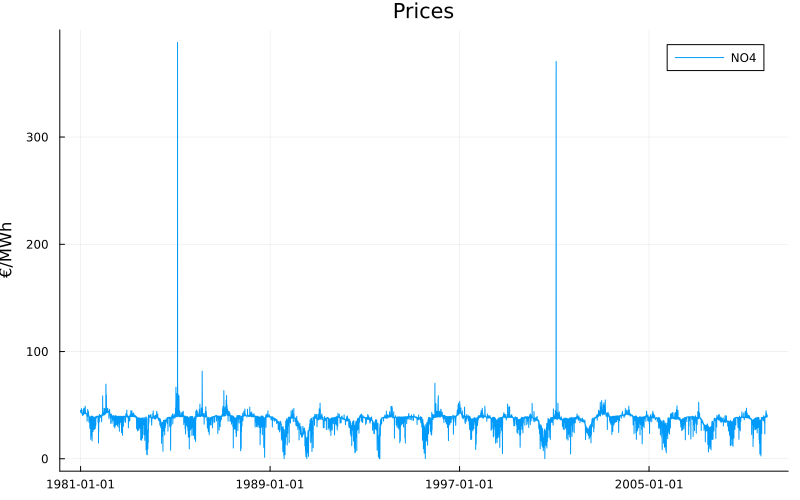

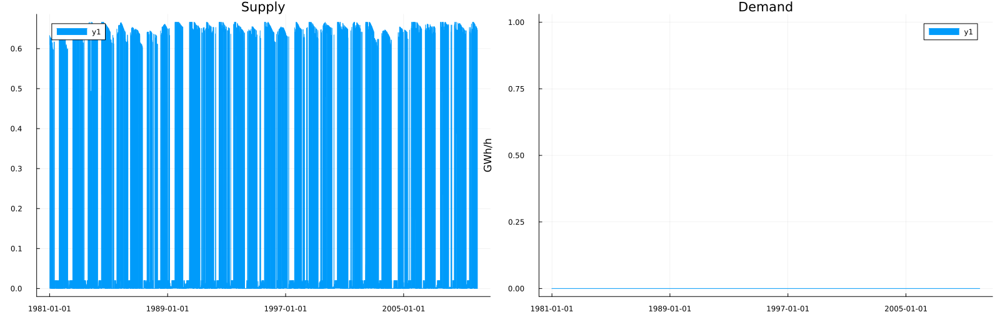

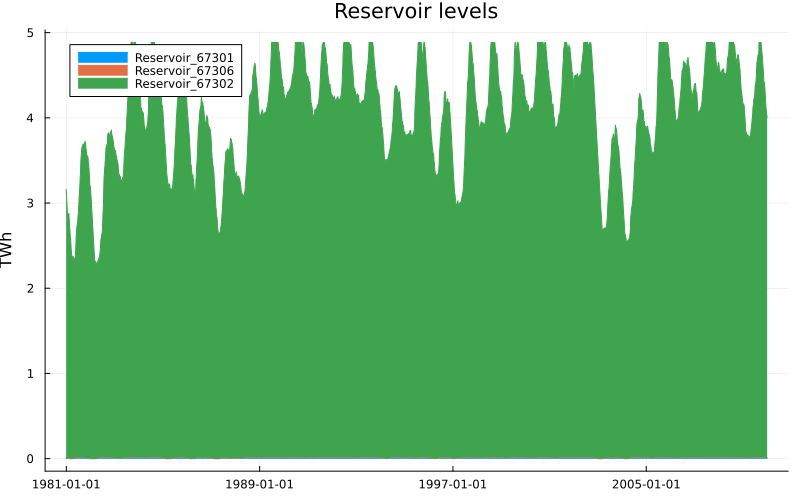

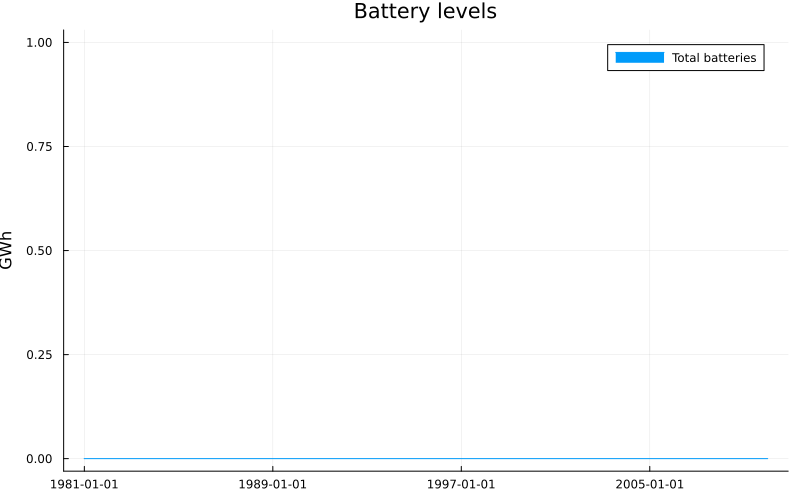

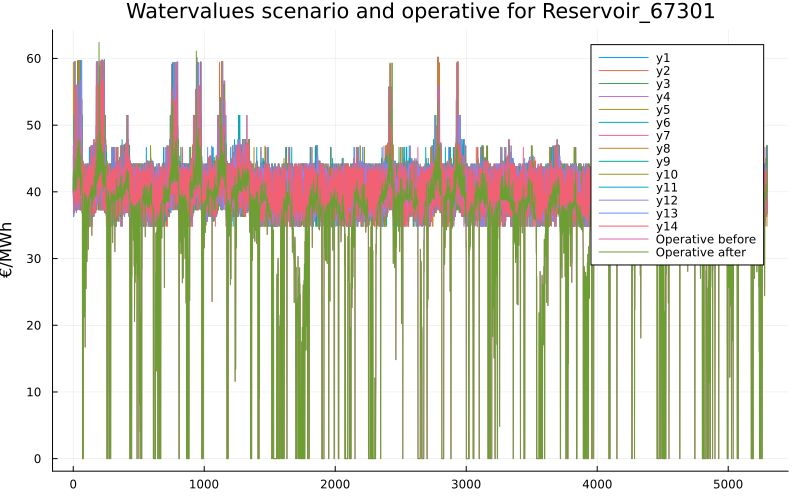

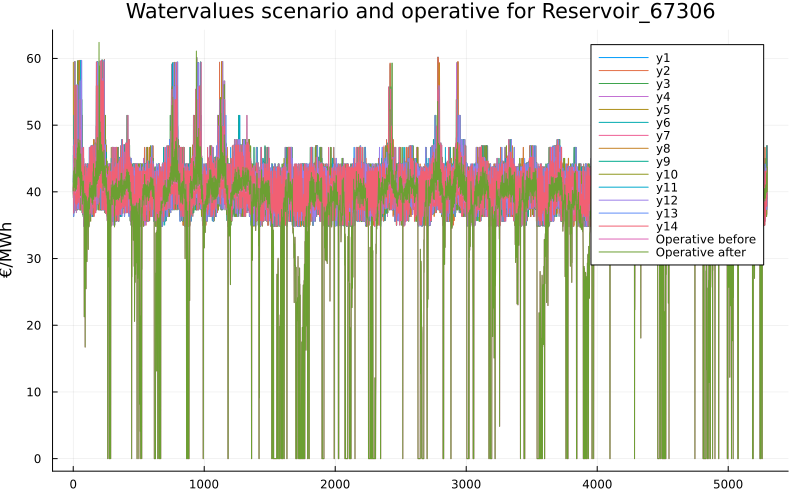

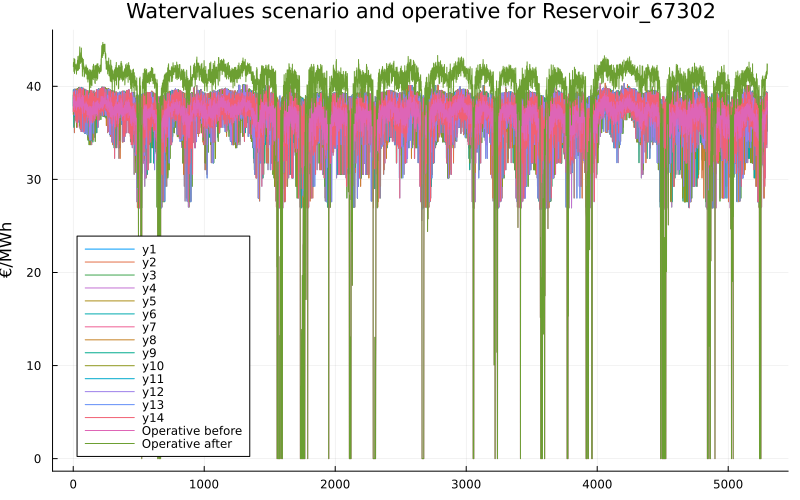

2×4 DataFrame
 Row │ Supplyname     Yearly_supply_TWh  Demandname  Yearly_demand_TWh 
     │ String?        Float64?           String?     Float64?          
─────┼─────────────────────────────────────────────────────────────────
   1 │ Release_67302          2.25494    missing               missing 
   2 │ Release_67301          0.0684233  missing               missing 2×4 DataFrame
 Row │ Supplyname     Yearly_rev_mill€  Demandname  Yearly_cost_mill€ 
     │ String?        Float64?          String?     Float64?          
─────┼────────────────────────────────────────────────────────────────
   1 │ Release_67302          85.0527   missing               missing 
   2 │ Release_67301           2.43657  missing               missing 1×2 DataFrame
 Row │ Yearly_rev_mill€_sum_skipmissing  Yearly_cost_mill€_sum_skipmissing 
     │ Float64                           Float64                           
─────┼─────────────────────────────────────────────────────────────────────
   1 │           

In [56]:
# Plot prices
display(plot(x1, prices, labels=reshape(powerbalancenames,1,length(powerbalancenames)), size=(800,500), title="Prices", ylabel="€/MWh"))

# # Plot supplies and demands
# supplychart = plot(x1, supplyvalues,labels=reshape(supplynames,1,length(supplynames)),title="Supply", ylabel = "GWh/h")
# demandchart = plot(x1, demandvalues,labels=reshape(demandnames,1,length(demandnames)),title="Demand", ylabel = "GWh/h")
supplychart = areaplot(x1, sum(supplyvalues,dims=2),title="Supply", ylabel = "GWh/h")
demandchart = areaplot(x1, sum(demandvalues,dims=2),title="Demand", ylabel = "GWh/h")
display(plot([supplychart,demandchart]...,layout=(1,2),size=(1600,500)))

# Plot storages
display(areaplot(x2, hydrolevels1,labels=reshape(hydronames,1,length(hydronames)),size=(800,500),title="Reservoir levels", ylabel = "TWh")) #
# display(areaplot(x2, dropdims(sum(hydrolevels,dims=2),dims=2),labels="Total reservoirs",size=(800,500),title="Reservoir levels", ylabel = "Gm3")) #

display(areaplot(x1, dropdims(sum(batterylevels,dims=2),dims=2),labels="Total batteries",size=(800,500),title="Battery levels", ylabel = "GWh")) #

# Plot list of yearly mean production and demand for each supply/demand
meandemand = dropdims(mean(demandvalues,dims=1),dims=1)
meanproduction = dropdims(mean(supplyvalues,dims=1),dims=1)
supplydf = sort(DataFrame(Supplyname = supplynames, Yearly_supply_TWh = meanproduction*8.76),[:Yearly_supply_TWh], rev = true)
demanddf = sort(DataFrame(Demandname = demandnames, Yearly_demand_TWh = meandemand*8.76),[:Yearly_demand_TWh], rev = true)
supplydf[!,:ID] = collect(1:length(supplynames))
demanddf[!,:ID] = collect(1:length(demandnames))
joineddf = select!(outerjoin(supplydf,demanddf;on=:ID),Not(:ID))
show(joineddf,allcols=true, allrows=true)

# Check that total supply equals total demand
# show(combine(joineddf, [:Yearly_supply_TWh, :Yearly_demand_TWh] .=> sum∘skipmissing))

# Plot list of yearly income and cost for each supply/demand
supplyrev = copy(supplyvalues)
for (i,supplybalancename) in enumerate(supplybalancenames)
    idx = findfirst(isequal(supplybalancename), powerbalancenames)
    supplyrev[:,i] .= supplyrev[:,i] .* prices[:,idx]
end
demandrev = copy(demandvalues)
for (i,demandbalancename) in enumerate(demandbalancenames)
    idx = findfirst(isequal(demandbalancename), powerbalancenames)
    demandrev[:,i] .= demandrev[:,i] .* prices[:,idx]
end
meandemandrev = dropdims(mean(demandrev,dims=1),dims=1)
meanproductionrev = dropdims(mean(supplyrev,dims=1),dims=1)
supplyrevdf = sort(DataFrame(Supplyname = supplynames, Yearly_rev_mill€ = meanproductionrev*8.76),[:Yearly_rev_mill€], rev = true)
demandrevdf = sort(DataFrame(Demandname = demandnames, Yearly_cost_mill€ = meandemandrev*8.76),[:Yearly_cost_mill€], rev = true)
supplyrevdf[!,:ID] = collect(1:length(supplynames))
demandrevdf[!,:ID] = collect(1:length(demandnames))
joinedrevdf = select!(outerjoin(supplyrevdf,demandrevdf;on=:ID),Not(:ID))
show(joinedrevdf,allcols=true, allrows=true)

# Sum revenues and cost
show(combine(joinedrevdf, [:Yearly_rev_mill€, :Yearly_cost_mill€] .=> sum∘skipmissing))

# Plot watervalues for each reservoir and scenarios
for (i,obj) in enumerate(cuts.objects)
    name = getinstancename(getid(obj))

   p = plot(watervalues[:,1:numscen*2,i] * -1, size=(800,500), title="Watervalues scenario and operative for " * name, ylabel="€/MWh")
   plot!(p, watervalues[:,numscen*2+1,i] * -1, labels="Operative before")
   plot!(p, watervalues[:,numscen*2+2,i] * -1, labels="Operative after")
   display(p)
end